In [1]:
from collections import Counter
import pathlib
from typing import Dict, List
import warnings
import yaml

import lightgbm as lgb
import matplotlib.pyplot as plt
import numpy as np
import optuna
from optuna.samplers import TPESampler
import pandas as pd
from sklearn.model_selection import TimeSeriesSplit


warnings.simplefilter('ignore')

/home/ss/miniconda3/envs/optiver/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def train_using_cv(
        dataset: pd.DataFrame,
        kfold_params: Dict,
        outputs_dir: pathlib.Path,
    ):
    
    kfold = TimeSeriesSplit(**kfold_params)
    target_columns = ['target']
    feature_columns = [
        col for col in dataset.columns
        if col not in ['stock_id', 'date_id', 'target', 'time_id', 'row_id']
    ]
    time = np.arange(dataset['date_id'].min(), dataset['date_id'].max())
    oof_true = []
    oof_pred = []
    fimps = []
    best_param_records = {}
    best_value_records = {}
    for k, (train_indices, valid_indices) in enumerate(kfold.split(time)):
        print(f'fold {k+1}')
        train_time = time[train_indices]
        valid_time = time[valid_indices]
        print(train_time.shape, np.min(train_time), np.max(train_time))
        print(valid_time.shape, np.min(valid_time), np.max(valid_time))

        # _, ax = plt.subplots()
        # ax.barh(y='all', height=0.6, width=len(time), left=0, color='tab:blue')
        # ax.barh(y='train+valid', height=0.6, width=[len(train_time), len(valid_time)],
        #         left=[train_time.min(), valid_time.min()], color=['tab:orange', 'tab:green'])
        # xcenter = [len(time)//2, train_time.min()+len(train_time)//2, valid_time.min()+len(valid_time)//2]
        # ycenter = [0, 1, 1]
        # width = [len(time), len(train_time), len(valid_time)]
        # for x, y, w in zip(xcenter, ycenter, width):
        #     ax.text(x, y, str(w),  ha='center', va='center')
        # if kfold_params['gap'] > 0:
        #     ax.set_xticks([train_time.min(), train_time.max(), valid_time.min(), valid_time.max(), time.max()])
        # else:
        #     ax.set_xticks([train_time.min(), train_time.max(), valid_time.max(), time.max()])
        # ax.grid(axis='x', linestyle='--')
        # ax.tick_params(axis='x', labelrotation=45)
        # plt.show()
        
        train_X = dataset.query('date_id in @train_time')[feature_columns].values
        train_y = dataset.query('date_id in @train_time')[target_columns].values.reshape(-1)
        valid_X = dataset.query('date_id in @valid_time')[feature_columns].values
        valid_y = dataset.query('date_id in @valid_time')[target_columns].values.reshape(-1)
        # print(train_X.shape, train_y.shape)
        # print(valid_X.shape, valid_y.shape)
        
        best_param_records[f'fold{k+1}'] = {}
        best_value_records[f'fold{k+1}'] = {}

        objective = Objective(train_X, train_y, valid_X, valid_y)
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(seed=42))
        optuna.logging.set_verbosity(optuna.logging.WARNING)
        study.optimize(objective, n_trials=10)
        best_params = study.best_params
        add_params = {
            'task': 'train',
            'boosting_type': 'gbdt',
            'objective': 'mae',
            'metric': 'mae',
            'seed': 42,
        }
        best_params.update(add_params)

        # [print(f'{k}: {v}') for k, v in best_params.items()]
        # print(f'best value: {study.best_value}')

        best_param_records[f'fold{k+1}'] = best_params
        best_value_records[f'fold{k+1}'] = study.best_value
        callbacks = [
            lgb.early_stopping(stopping_rounds=100, verbose=True),
            lgb.log_evaluation(100),
        ]
        
        train_dataset = lgb.Dataset(train_X, train_y)
        valid_dataset = lgb.Dataset(valid_X, valid_y)
        
        model = lgb.train(
            params=best_params,
            train_set=train_dataset,
            valid_sets=[train_dataset, valid_dataset],
            valid_names=['train', 'valid'],
            callbacks=callbacks,
            num_boost_round=3000,
        )
        # model.save_model(
        #     outputs_dir.joinpath(f'lightgbm_optuna_group_fold{k+1}'),
        #     num_iteration=model.best_iteration
        # )

        fimp = model.feature_importance(importance_type='gain')
        fimp = pd.DataFrame(fimp, index=feature_columns, columns=[f'fold{k+1}'])
        fimps.append(fimp)
        
        oof_true.append(valid_y)
        oof_pred.append(model.predict(valid_X))
    
    fimps = pd.concat(fimps, axis=1)

    mean_fimps = fimps.mean(axis=1)
    std_fimps = fimps.std(axis=1)
    fimps['mean_fimps'] = mean_fimps
    fimps['std_fimps'] = std_fimps
    fimps.sort_values(by='mean_fimps', inplace=True)
    # display(fimps)
    
    # fimps['mean_fimps'].plot(kind='barh', xerr=fimps['std_fimps'], capsize=3)
    # plt.show()
    
    oof_true = np.concatenate(oof_true)
    oof_pred = np.concatenate(oof_pred)
    oof_mae = np.mean(abs(oof_true - oof_pred))
    print(f'oof mae: {oof_mae:.4f}')
    
    # with open(outputs_dir.joinpath('result_lightgbm_optuna.yaml'), 'w') as f:
    #     yaml.dump(
    #         {
    #             'best_param_records': best_param_records,
    #             'best_value_records': best_value_records,
    #             'oof rmse': oof_mae.item(),
    #         },
    #         f,
    #         default_flow_style=False
    #     )
    return oof_mae


class Objective:
    def __init__(self, train_X, train_y, valid_X, valid_y):
        self.train_X = train_X
        self.train_y = train_y
        self.valid_X = valid_X
        self.valid_y = valid_y

    def __call__(self, trial):
        params = {
            'task': 'train',
            'boosting_type': 'gbdt',
            'objective': 'mae',
            'metric': 'mae',
            'learning_rate': trial.suggest_float('learning_rate', 1e-03, 1e-01),
            'seed': 42,
            'max_depth':  trial.suggest_int('max_depth', 3, 10),
            #'num_leaves': trial.suggest_int('max_depth', 31, 127),
            'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 20, 100),
            'feature_fraction': trial.suggest_float('feature_fraction', 0.2, 1.0),
            'feature_fraction_bynode': trial.suggest_float('feature_fraction_bynode', 0.2, 1.0),
            #'lambda_l2': trial.suggest_float('lambda_l2', 0.1, 10),
            'verbose': -1,
        }
        
        callbacks = [
            lgb.early_stopping(stopping_rounds=100, verbose=True),
            lgb.log_evaluation(0),
        ]
        train_dataset = lgb.Dataset(self.train_X, self.train_y)
        valid_dataset = lgb.Dataset(self.valid_X, self.valid_y)
        model = lgb.train(
            params=params,
            train_set=train_dataset,
            valid_sets=[train_dataset, valid_dataset],
            valid_names=['train', 'valid'],
            callbacks=callbacks,
            num_boost_round=trial.suggest_int('num_boost_round', 500, 3000),
        )

        preds = model.predict(self.valid_X)
        mae = np.mean(abs(preds - self.valid_y))
        return mae

In [3]:
inputs_dir_path = pathlib.Path('../inputs')
outputs_dir_path = pathlib.Path('../outputs')
if not outputs_dir_path.is_dir():
    outputs_dir_path.mkdir()

train_df = pd.read_csv(inputs_dir_path.joinpath('train.csv'))
train_df = train_df.dropna(subset=['target'])
display(train_df)

,stock_id,date_id,seconds_in_bucket,imbalance_size,imbalance_buy_sell_flag,reference_price,matched_size,far_price,near_price,bid_price,bid_size,ask_price,ask_size,wap,target,time_id,row_id
0,0,0,0,3180602.69,1,0.999812,13380276.64,NaN,NaN,0.999812,60651.50,1.000026,8493.03,1.000000,-3.029704,0,0_0_0
1,1,0,0,166603.91,-1,0.999896,1642214.25,NaN,NaN,0.999896,3233.04,1.000660,20605.09,1.000000,-5.519986,0,0_0_1
2,2,0,0,302879.87,-1,0.999561,1819368.03,NaN,NaN,0.999403,37956.00,1.000298,18995.00,1.000000,-8.389950,0,0_0_2
3,3,0,0,11917682.27,-1,1.000171,18389745.62,NaN,NaN,0.999999,2324.90,1.000214,479032.40,1.000000,-4.010200,0,0_0_3
4,4,0,0,447549.96,-1,0.999532,17860614.95,NaN,NaN,0.999394,16485.54,1.000016,434.10,1.000000,-7.349849,0,0_0_4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5237975,195,480,540,2440722.89,-1,1.000317,28280361.74,0.999734,0.999734,1.000317,32257.04,1.000434,319862.40,1.000328,2.310276,26454,480_540_195
5237976,196,480,540,349510.47,-1,1.000643,9187699.11,1.000129,1.000386,1.000643,205108.40,1.000900,93393.07,1.000819,-8.220077,26454,480_540_196
5237977,197,480,540,0.00,0,0.995789,12725436.10,0.995789,0.995789,0.995789,16790.66,0.995883,180038.32,0.995797,1.169443,26454,480_540_197
5237978,198,480,540,1000898.84,1,0.999210,94773271.05,0.999210,0.999210,0.998970,125631.72,0.999210,669893.00,0.999008,-1.540184,26454,480_540_198


In [4]:
kfold_params = {
    'n_splits': 5,
    'max_train_size': None,
    'test_size': None,
    'gap': 0,
}

mae_per_stock_id = []
for s in range(200):
    mae = train_using_cv(
        kfold_params=kfold_params,
        dataset=train_df.query('stock_id==@s'),
        outputs_dir=outputs_dir_path,
    )
    mae_per_stock_id.append(mae)

[I 2023-11-11 18:06:34,719] A new study created in memory with name: no-name-aa0f86ef-0284-44b4-affa-97f1d87012c0


fold 1
(80,) 0 79
(80,) 80 159
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[82]	train's l1: 2.99252	valid's l1: 4.8218
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[303]	train's l1: 3.10989	valid's l1: 4.82776
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[44]	train's l1: 3.21211	valid's l1: 4.81987
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[63]	train's l1: 3.19048	valid's l1: 4.81767
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[62]	train's l1: 2.92302	valid's l1: 4.82853
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[37]	train's l1: 3.21159	valid's l1: 4.8499
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[165]	train's l1: 3.2

In [5]:
mae_per_stock_id = pd.DataFrame(
    mae_per_stock_id,
    index=np.arange(len(mae_per_stock_id)),
    columns=['mae'],
)
display(mae_per_stock_id)

,mae
0,4.555037
1,8.849797
2,7.787529
3,4.018722
4,4.480945
...,...
195,4.717989
196,5.517245
197,6.622570
198,4.401402


In [6]:
q2 = mae_per_stock_id.quantile(0.50).item()
q3 = mae_per_stock_id.quantile(0.75).item()
print(f'q2: {q2:.4f}, q3: {q3:.4f}')
display(mae_per_stock_id.query('mae <= @q2').describe())
display(mae_per_stock_id.query('mae > @q2').describe())

display(mae_per_stock_id.query('mae <= @q3').describe())
display(mae_per_stock_id.query('mae > @q3').describe())

q2: 5.9248, q3: 7.5762


,mae
count,100.000000
mean,4.947429
std,0.600442
min,3.597494
25%,4.558161
50%,4.923071
75%,5.413165
max,5.922267


,mae
count,100.000000
mean,8.091661
std,1.937698
min,5.927290
25%,6.575408
50%,7.590463
75%,8.925974
max,13.853650


,mae
count,150.000000
mean,5.509484
std,0.971953
min,3.597494
25%,4.712480
50%,5.413404
75%,6.253008
max,7.561853


,mae
count,50.000000
mean,9.549729
std,1.742749
min,7.619074
25%,8.207050
50%,8.951492
75%,10.864396
max,13.853650


In [7]:
mae_smaller_than_q2 = mae_per_stock_id.query('mae <= @q2')
mae_larger_than_q2 = mae_per_stock_id.query('mae > @q2')

stock_id_smaller_than_q2 = mae_smaller_than_q2.index.to_list()
stock_id_larger_than_q2 = mae_larger_than_q2.index.to_list()

df_smaller_than_q2 = train_df.query('stock_id in @stock_id_smaller_than_q2')
df_larger_than_q2 = train_df.query('stock_id in @stock_id_larger_than_q2')
display(df_smaller_than_q2)
display(df_larger_than_q2)

,stock_id,date_id,seconds_in_bucket,imbalance_size,imbalance_buy_sell_flag,reference_price,matched_size,far_price,near_price,bid_price,bid_size,ask_price,ask_size,wap,target,time_id,row_id
0,0,0,0,3180602.69,1,0.999812,13380276.64,NaN,NaN,0.999812,60651.50,1.000026,8493.03,1.000000,-3.029704,0,0_0_0
3,3,0,0,11917682.27,-1,1.000171,18389745.62,NaN,NaN,0.999999,2324.90,1.000214,479032.40,1.000000,-4.010200,0,0_0_3
4,4,0,0,447549.96,-1,0.999532,17860614.95,NaN,NaN,0.999394,16485.54,1.000016,434.10,1.000000,-7.349849,0,0_0_4
9,9,0,0,3039700.65,-1,1.000969,6248958.45,NaN,NaN,0.999354,6191.00,1.000646,6199.00,1.000000,7.970333,0,0_0_9
10,10,0,0,10482752.19,-1,1.001374,8839457.10,NaN,NaN,0.999885,18802.00,1.001321,217098.37,1.000000,5.350113,0,0_0_10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5237972,192,480,540,67162.62,1,1.000762,11790079.43,1.000834,1.000762,1.000545,168412.86,1.000762,69841.50,1.000698,-1.729727,26454,480_540_192
5237973,193,480,540,6500948.04,1,1.001599,80357531.06,1.002908,1.002326,1.001454,413142.24,1.001599,363532.53,1.001531,-3.880262,26454,480_540_193
5237975,195,480,540,2440722.89,-1,1.000317,28280361.74,0.999734,0.999734,1.000317,32257.04,1.000434,319862.40,1.000328,2.310276,26454,480_540_195
5237976,196,480,540,349510.47,-1,1.000643,9187699.11,1.000129,1.000386,1.000643,205108.40,1.000900,93393.07,1.000819,-8.220077,26454,480_540_196


,stock_id,date_id,seconds_in_bucket,imbalance_size,imbalance_buy_sell_flag,reference_price,matched_size,far_price,near_price,bid_price,bid_size,ask_price,ask_size,wap,target,time_id,row_id
1,1,0,0,166603.91,-1,0.999896,1.642214e+06,NaN,NaN,0.999896,3233.04,1.000660,20605.09,1.000000,-5.519986,0,0_0_1
2,2,0,0,302879.87,-1,0.999561,1.819368e+06,NaN,NaN,0.999403,37956.00,1.000298,18995.00,1.000000,-8.389950,0,0_0_2
5,5,0,0,0.00,0,1.000635,1.355288e+07,NaN,NaN,0.999779,1962.72,1.000635,5647.65,1.000000,6.779432,0,0_0_5
6,6,0,0,969969.40,1,1.000115,3.647504e+06,NaN,NaN,0.999506,6663.16,1.000283,3810.48,1.000000,-2.499819,0,0_0_6
7,7,0,0,9412959.10,1,0.999818,2.126125e+07,NaN,NaN,0.999741,5139.20,1.000130,2570.60,1.000000,-1.959801,0,0_0_7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5237970,190,480,540,466320.15,-1,0.999295,3.929472e+07,0.998983,0.999139,0.999295,19725.86,0.999451,169105.20,0.999311,-0.470281,26454,480_540_190
5237971,191,480,540,36937785.44,1,0.995983,6.083261e+08,0.999086,0.997746,0.995913,84744.00,0.995983,48025.00,0.995958,0.799894,26454,480_540_191
5237974,194,480,540,262271.52,-1,1.001504,3.922295e+06,1.000677,1.000677,1.001504,20829.20,1.001917,139637.49,1.001557,4.839897,26454,480_540_194
5237977,197,480,540,0.00,0,0.995789,1.272544e+07,0.995789,0.995789,0.995789,16790.66,0.995883,180038.32,0.995797,1.169443,26454,480_540_197


In [8]:
df_smaller_than_q2.to_csv(outputs_dir_path.joinpath('train_ez.csv'), index=False)
df_larger_than_q2.to_csv(outputs_dir_path.joinpath('train_not_ez.csv'), index=False)

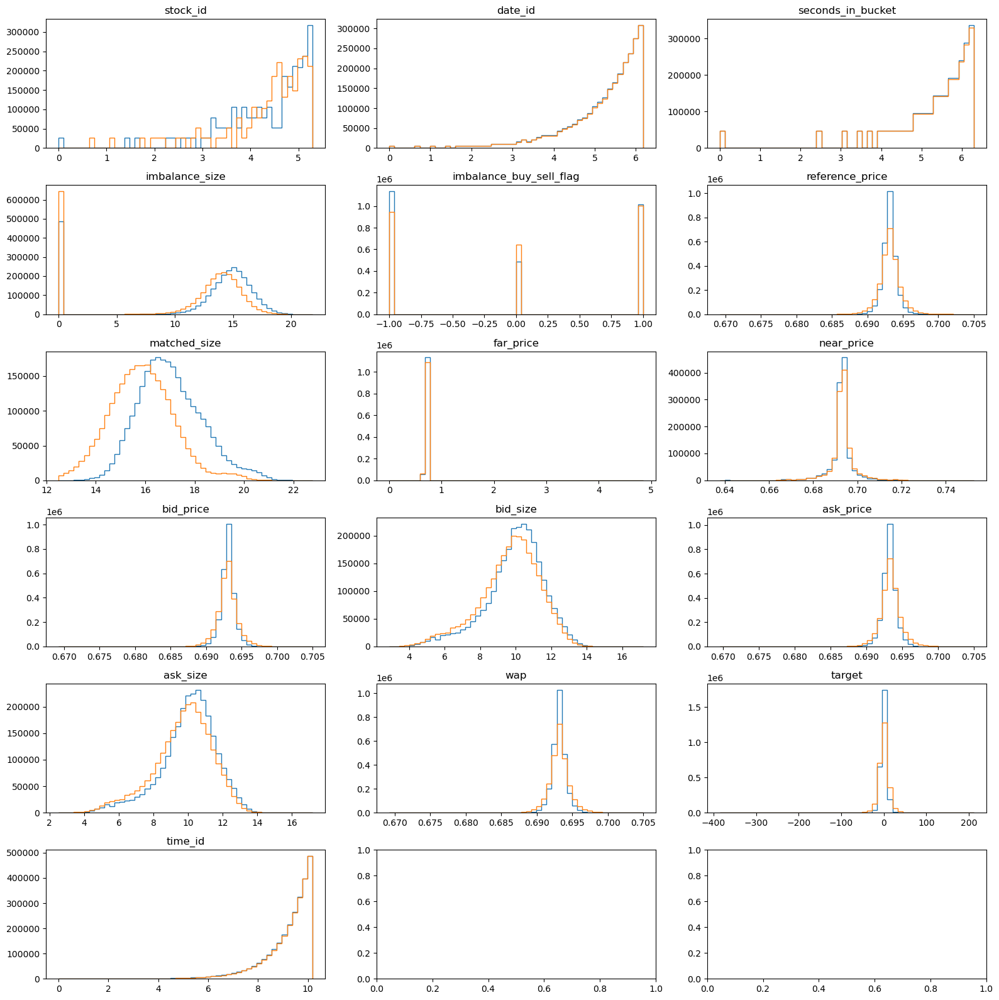

In [9]:
nrows = len(train_df.columns) // 3 if len(train_df.columns) % 3 == 0 else len(train_df.columns) // 3 + 1
_, axs = plt.subplots(nrows, 3, figsize=(16, 16))
for i, col in enumerate(train_df.columns):
    if col != 'row_id':
        if train_df[col].min() < 0:
            _, bins, _ = axs[i//3, i%3].hist(df_smaller_than_q2[col], bins=50, histtype='step')
            axs[i//3, i%3].hist(df_larger_than_q2[col], bins=bins, histtype='step')
        else:
            _, bins, _ = axs[i//3, i%3].hist(np.log1p(df_smaller_than_q2[col]), bins=50, histtype='step')
            axs[i//3, i%3].hist(np.log1p(df_larger_than_q2[col]), bins=bins, histtype='step')
        axs[i//3, i%3].set_title(col)
plt.tight_layout()
plt.show()

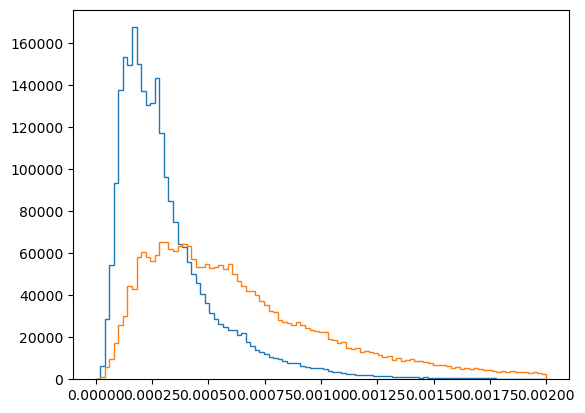

In [10]:
bins = np.linspace(0.0, 0.002, 100)
_, ax = plt.subplots()
ax.hist(df_smaller_than_q2['ask_price']-df_smaller_than_q2['bid_price'], bins=bins, histtype='step')
ax.hist(df_larger_than_q2['ask_price']-df_larger_than_q2['bid_price'], bins=bins, histtype='step')
plt.show()

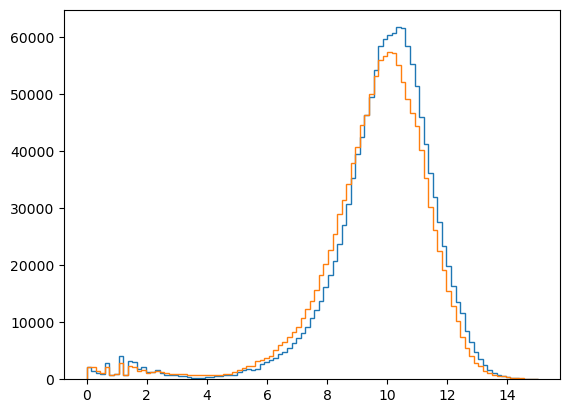

In [11]:
bins = np.linspace(0.0, 15, 100)
_, ax = plt.subplots()
ax.hist(np.log1p(df_smaller_than_q2['ask_size']-df_smaller_than_q2['bid_size']), bins=bins, histtype='step')
ax.hist(np.log1p(df_larger_than_q2['ask_size']-df_larger_than_q2['bid_size']), bins=bins, histtype='step')
plt.show()